In [ ]:
import os, sys, re, functools, itertools, collections, time, random, pickle, warnings, json, subprocess
pkg_path = '/home/jupyter/code'
if pkg_path not in sys.path:
    sys.path.append(pkg_path)
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas

import torch
import torch.nn as nn

from utility import get_label_image, get_cor, get_cor_map, get_topk_indices, get_cor_map_4d, get_local_mean
from utility import get_prime_factors
from visualization import imshow, plot_image_label_overlay, make_video_ffmpeg, get_good_colors, plot_colortable
from models import UNet
from denoise import get_denoised_mat, model_denoise, SeparateNet
from segmentation import get_traces

use_gpu = True
if use_gpu and torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
    
%load_ext autoreload
%autoreload 2

# Load data

In [ ]:
data_folder = 'optosynth_test_mb'
# data_folder = '../data'

mat = torch.from_numpy(np.load(f'{data_folder}/mat.npy')).float().to(device)
trend = torch.from_numpy(np.load(f'{data_folder}/trend.npy')).float().to(device)
clean = torch.from_numpy(np.load(f'{data_folder}/clean.npy')).float().to(device)
masks = torch.from_numpy(np.load(f'{data_folder}/masks_nyx.npy')).to(device)
soma_coords = torch.from_numpy(np.load(f'{data_folder}/soma_coords_n2.npy')).to(device)
traces = torch.from_numpy(np.load(f'{data_folder}/neuron_mean_fluorescence_nt.npy')).float().to(device)
nframe, nrow, ncol = mat.shape

def get_loss(pred, target, mask=None, loss_fn=nn.MSELoss()):
    if mask is not None:
        pred = pred[:, mask]
        target = target[:, mask]
    loss = loss_fn(pred, target)
    return loss.sqrt().item()
mask_soma = torch.zeros(nrow, ncol).bool()
mask_soma[soma_coords[:, 1], soma_coords[:, 0]] = True
mask_cell = masks.float().max(0)[0].bool()

In [ ]:
cor_map = get_cor_map(mat, topk=4)
target = clean - trend

fig, ax = plt.subplots(3, figsize=(16, 21))
im = ax[0].imshow(cor_map.cpu().numpy())
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="2%", pad=0.1)
fig.colorbar(im, cax=cax)
ax[0].scatter(soma_coords[:, 0].cpu().numpy(), soma_coords[:, 1].cpu().numpy(), c='r')
ax[0].set_title('correlation map of noisy video (red dots are somas)')
im = ax[1].imshow(target.mean(0).cpu().numpy())
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="2%", pad=0.1)
fig.colorbar(im, cax=cax)
ax[1].scatter(soma_coords[:, 0].cpu().numpy(), soma_coords[:, 1].cpu().numpy(), c='r')
ax[1].set_title('temporal mean of the clean video (red dots are somas)')
im = ax[2].imshow(clean.mean(0).cpu().numpy())
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="2%", pad=0.1)
fig.colorbar(im, cax=cax)
ax[2].scatter(soma_coords[:, 0].cpu().numpy(), soma_coords[:, 1].cpu().numpy(), c='r')
ax[2].set_title('temporal mean of the clean video (before detrending)')
fig.tight_layout()
plt.savefig(f'{data_folder}/cor_map.png')
plt.show()

fig, ax = plt.subplots(10, 5, figsize=(20, 30))
for i in range(50):
    x, y = i//5, i%5
    ax[x, y].imshow((cor_map*masks[i].float()).cpu().numpy())
    ax[x, y].set_title(f'{i}')
    ax[x, y].scatter(soma_coords[i, 0].cpu().numpy(), soma_coords[i, 1].cpu().numpy(), c='r')
fig.tight_layout()
plt.title('Individual neurons on correlation map')
plt.savefig(f'{data_folder}/individual_neurons_cor_map.png')
plt.show()

plt.figure(figsize=(10, 30))
plt.plot(traces.T.cpu())
plt.title('Neuron mean fluorescence')
plt.savefig(f'{data_folder}/individual_neurons_mean_fluorescence.png')
plt.show()

In [ ]:
raw_traces = torch.stack([mat[:, mask].mean(dim=1) for mask in masks], dim=1).T.cpu().numpy()
clean_traces = torch.stack([target[:, mask].mean(dim=1) for mask in masks], dim=1).T.cpu().numpy()
step = np.max(clean_traces.max(1) - clean_traces.min(1))
fig, ax = plt.subplots(figsize=(10, 80))
for i in range(len(raw_traces)):
    ax.plot(raw_traces[i] - i*step, 'g-.', markersize=1, alpha=0.8, label='noisy' if i==0 else None)
    ax.plot(clean_traces[i] - i*step, 'r-', markersize=1, alpha=0.5, label='clean' if i==0 else None)
    ax.text(-30, -i*step, f'{i+1}')
ax.set_ylim(-step*len(raw_traces), step)
ax.legend()
ax.set_title('Mean traces (noisy and clean)')
plt.savefig(f'{data_folder}/mean_traces.png')
plt.show()

raw_traces = mat[:, mask_soma].T.cpu().numpy()
clean_traces = target[:, mask_soma].T.cpu().numpy()
step = np.max(clean_traces.max(1) - clean_traces.min(1))
fig, ax = plt.subplots(figsize=(10, 80))
for i in range(len(raw_traces)):
    ax.plot(raw_traces[i] - i*step, 'g-.', markersize=1, alpha=0.8, label='noisy' if i==0 else None)
    ax.plot(clean_traces[i] - i*step, 'r-', markersize=1, alpha=0.5, label='clean' if i==0 else None)
    ax.text(-30, -i*step, f'{i+1}')
ax.set_ylim(-step*len(raw_traces), step)
ax.legend()
ax.set_title('Soma traces (noisy and clean)')
plt.savefig(f'{data_folder}/soma_traces.png')
plt.show()

In [ ]:
command = ['gsutil', 'cp', f'{data_folder}/*png', f'gs://tma-opp-test/optosynth/optosynth_test_mb/data/']
response = subprocess.run(command)
assert response.returncode == 0

In [ ]:
save_folder = 'cellmincer-with_global_features_mse'
if not os.path.exists(save_folder):
    print(f'Download folder gs://tma-opp-test/optosynth/optosynth_test_mb/results/{save_folder}')
    command = ['gsutil', '-m', 'cp', '-r', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{save_folder}', '.']
    response = subprocess.run(command, capture_output=True)
    assert response.returncode == 0

# Noise2Self

In [ ]:
print(save_folder)
movie_start_idx = 100
movie_end_idx = 700
if re.search('cellmincer', save_folder):
    num_epochs = 80
    if re.search('epochs', save_folder):
        num_epochs = int(save_folder[-8:-6])
    num_iters = 1000
else:
    with open(f'{save_folder}/config.json', 'r') as f:
        config = json.load(f)
    num_episodes = len([k for k in config.keys() if re.search('^episode', k)])
    num_epochs = sum([config[f'episode{e}']['train_settings']['num_epochs'] for e in range(num_episodes)])
    num_iters = config['episode0']['train_settings']['num_iters']
print(num_iters, num_epochs)

In [ ]:
target = (clean-trend)[movie_start_idx:movie_end_idx]
if not os.path.exists(f'{data_folder}/movie_frame{movie_start_idx}to{movie_end_idx}_clean.avi'):
    print(f'Make video {data_folder}/movie_frame{movie_start_idx}to{movie_end_idx}_clean.avi')
    make_video_ffmpeg(target, save_path=f'{data_folder}/movie_frame{movie_start_idx}to{movie_end_idx}_clean.avi')
losses = []
losses_train = []
for epoch in range(num_epochs):
    pred = target.new_tensor(
        np.load(f'{save_folder}/denoised_movie_frame{movie_start_idx}to{movie_end_idx}_step{num_iters * (epoch+1)}.npy', allow_pickle=True))
    losses.append([get_loss(pred, target, mask=None),
                   get_loss(pred, target, mask=mask_cell),
                   get_loss(pred, target, mask=mask_soma),
                   get_loss(pred, target, mask=~mask_cell)])
    losses_train.append([get_loss(pred, mat[movie_start_idx:movie_end_idx], mask=None),
                   get_loss(pred, mat[movie_start_idx:movie_end_idx], mask=mask_cell),
                   get_loss(pred, mat[movie_start_idx:movie_end_idx], mask=mask_soma),
                   get_loss(pred, mat[movie_start_idx:movie_end_idx], mask=~mask_cell)])
    print(epoch, losses[-1])
    print(epoch, losses_train[-1])
save_path = f'{save_folder}/diff_movie_frame{movie_start_idx}to{movie_end_idx}_step{num_iters * (epoch+1)}.avi'
make_video_ffmpeg(pred - target, 
                  save_path=save_path)
command = ['gsutil', 'cp', save_path, f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{save_folder}/']
response = subprocess.run(command)
assert response.returncode == 0
losses = np.array(losses)
pandas.DataFrame(losses, columns=['all', 'cell', 'soma', 'background']).to_pickle(f'{save_folder}/rmse_losses.pkl')
losses_train = np.array(losses_train)
pandas.DataFrame(losses_train, columns=['all', 'cell', 'soma', 'background']).to_pickle(f'{save_folder}/rmse_losses_train.pkl')
fig, ax = plt.subplots(5, sharex=True, figsize=(10, 20))
ax[0].plot(losses[:, 0], 'ro-', label='all')
ax[0].legend()
ax[1].plot(losses[:, 1], 'bo-', label='cell')
ax[1].legend()
ax[2].plot(losses[:, 2], 'go-', label='soma')
ax[2].legend()
ax[3].plot(losses[:, 3], 'ko-', label='background')
ax[3].legend()
ax[4].plot(losses[:, 0], 'ro-', label='all')
ax[4].plot(losses[:, 1], 'bo-', label='cell')
ax[4].plot(losses[:, 2], 'go-', label='soma')
ax[4].plot(losses[:, 3], 'ko-', label='background')
ax[4].legend()
fig.tight_layout()
plt.savefig(f'{save_folder}/rmse_losses.png')
plt.show()

fig, ax = plt.subplots(5, sharex=True, figsize=(10, 20))
ax[0].plot(losses_train[:, 0], 'ro-', label='all')
ax[0].legend()
ax[1].plot(losses_train[:, 1], 'bo-', label='cell')
ax[1].legend()
ax[2].plot(losses_train[:, 2], 'go-', label='soma')
ax[2].legend()
ax[3].plot(losses_train[:, 3], 'ko-', label='background')
ax[3].legend()
ax[4].plot(losses_train[:, 0], 'ro-', label='all')
ax[4].plot(losses_train[:, 1], 'bo-', label='cell')
ax[4].plot(losses_train[:, 2], 'go-', label='soma')
ax[4].plot(losses_train[:, 3], 'ko-', label='background')
ax[4].legend()
fig.tight_layout()
plt.savefig(f'{save_folder}/rmse_losses_train.png')
plt.show()

command = ['gsutil', 'cp', f'{save_folder}/rmse*', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{save_folder}/']
response = subprocess.run(command)
assert response.returncode == 0

In [ ]:
# i = 3200
# model.load_state_dict(torch.load(f'{save_folder}/model_step{i}.pt'))

# mean_mat = mat.mean()
# std_mat = mat.std()
# denoised_mat = model_denoise(((mat - mean_mat) / std_mat)[movie_start_idx-frame_depth:movie_end_idx+frame_depth], model, ndim=ndim, frame_depth=frame_depth,
#                                  normalize=False, batch_size=batch_size_eval, replicate_pad=False)
# denoised_mat = denoised_mat * std_mat + mean_mat

# np.save(f'{save_folder}/denoised_movie_frame100to700_step{i}.npy', denoised_mat.cpu().numpy())

In [93]:
save_folder = '2d-noise2self_with_features'
num_iters = 1600
num_epochs = 40
# save_folder = 'cellmincer-with_global_features'
# num_iters = 1000
# num_epochs = 80

filepath = f'{save_folder}/denoised_movie_frame100to700_step{num_iters*num_epochs}.npy'
if not os.path.exists(filepath):
    command = ['gsutil', '-m', 'cp', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{filepath}', filepath]
    response = subprocess.run(command, capture_output=True)
    assert response.returncode == 0
pred = target.new_tensor(np.load(filepath))
# cor_map = get_cor_map(pred)
# imshow(cor_map, title='correlation map of predicted video', save_file=f'{save_folder}/cor_map_pred_{num_epochs}epochs.png')

In [123]:
M = (clean - trend)[100:700].reshape(600, -1).cpu().numpy()
min_val = M.min()
M = M - min_val

In [125]:
from sklearn.decomposition import NMF
ns = [51]
fig_folder = 'nmf_clean'
for n in ns:
    start_time = time.time()
    model = NMF(n_components=n, init='random', random_state=0)
    W = model.fit_transform(M)
    H = model.components_
    end_time = time.time()
    print(n, end_time - start_time)
#     np.save(f'{fig_folder}/w_{n}.npy', W)
#     np.save(f'{fig_folder}/h_{n}.npy', H)

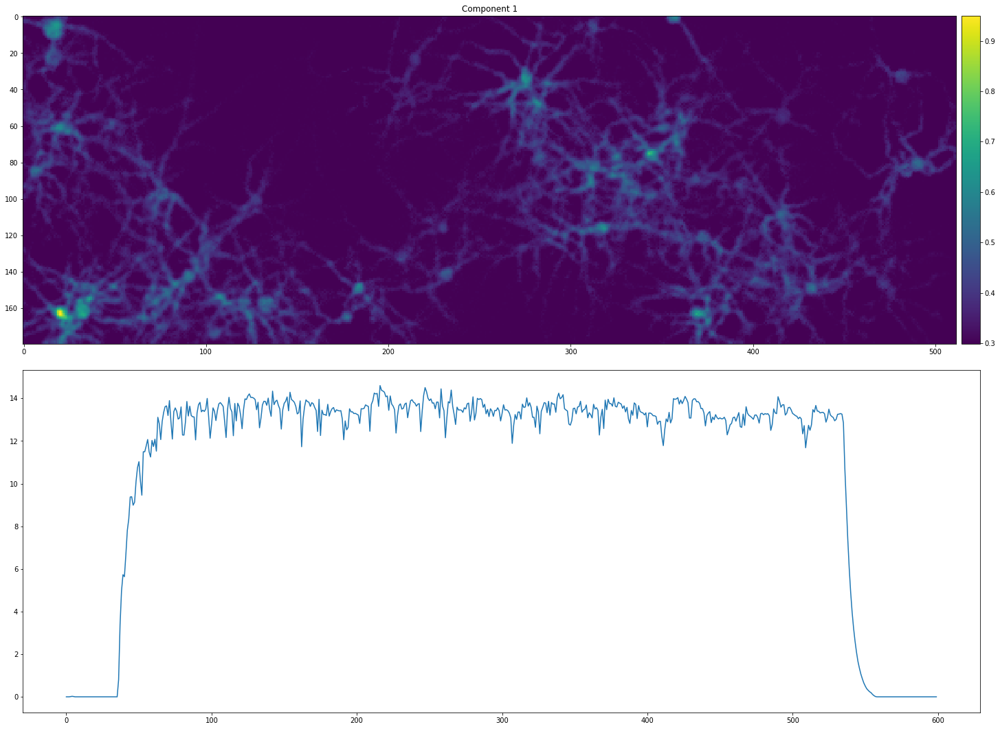

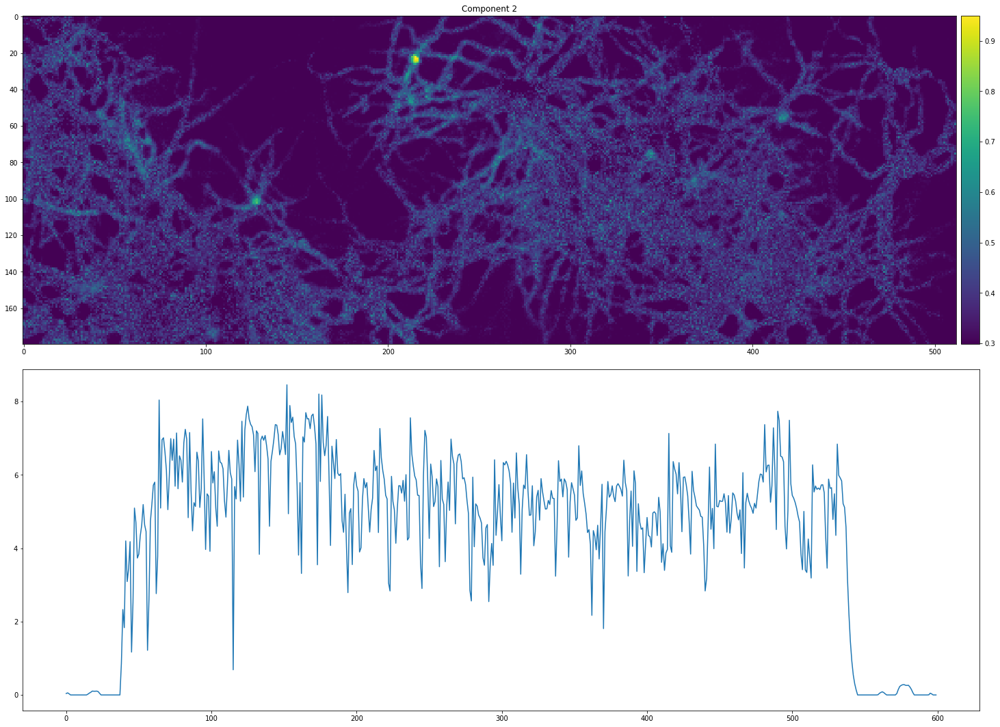

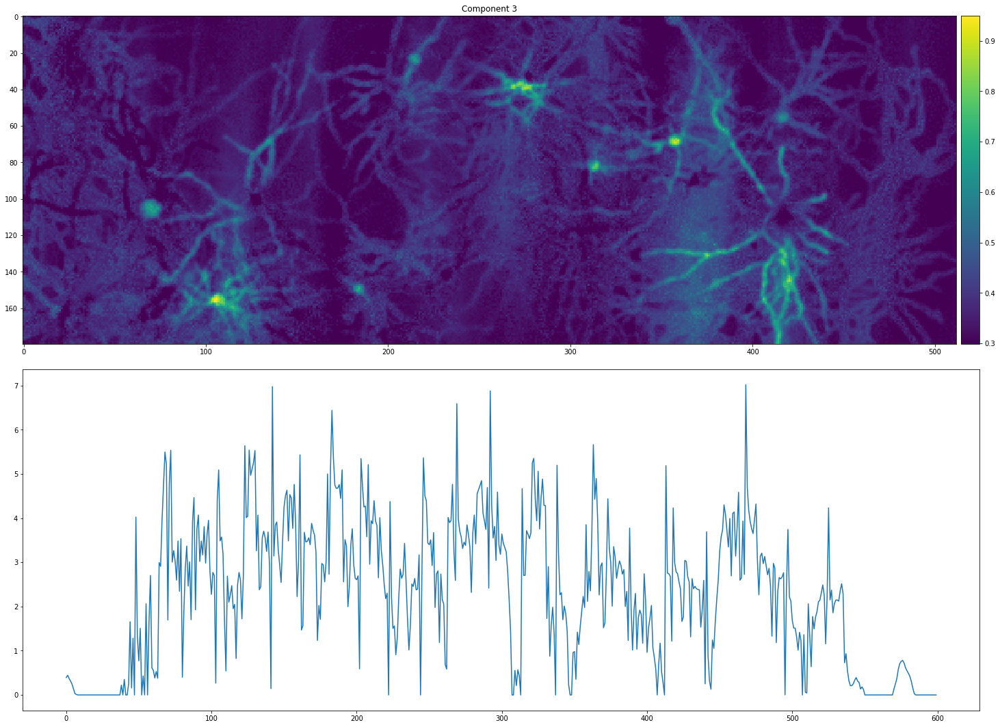

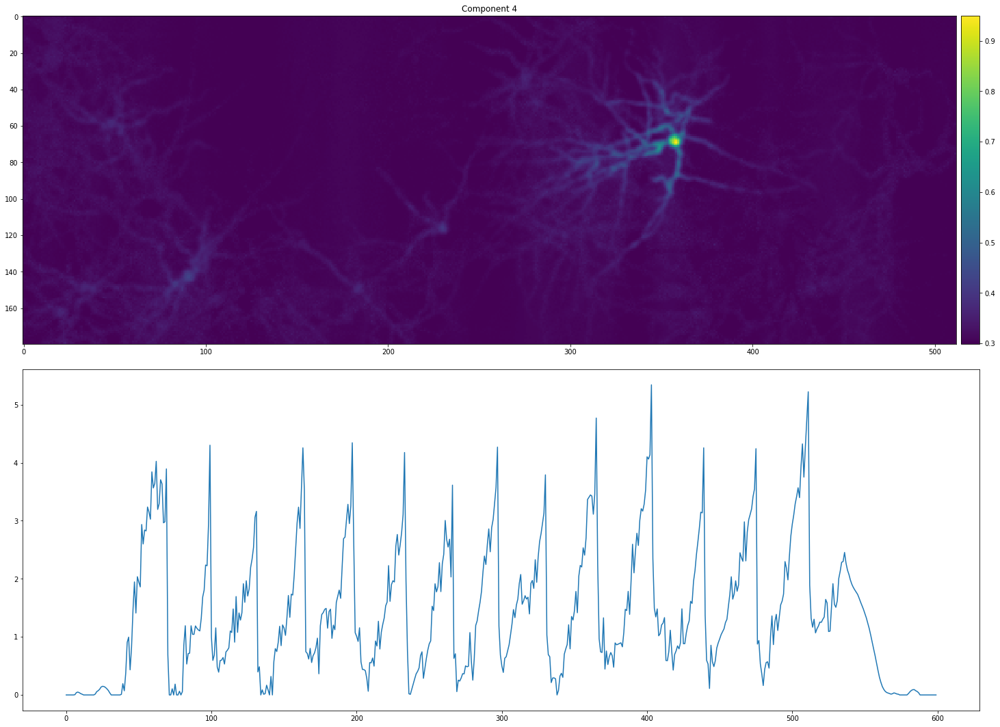

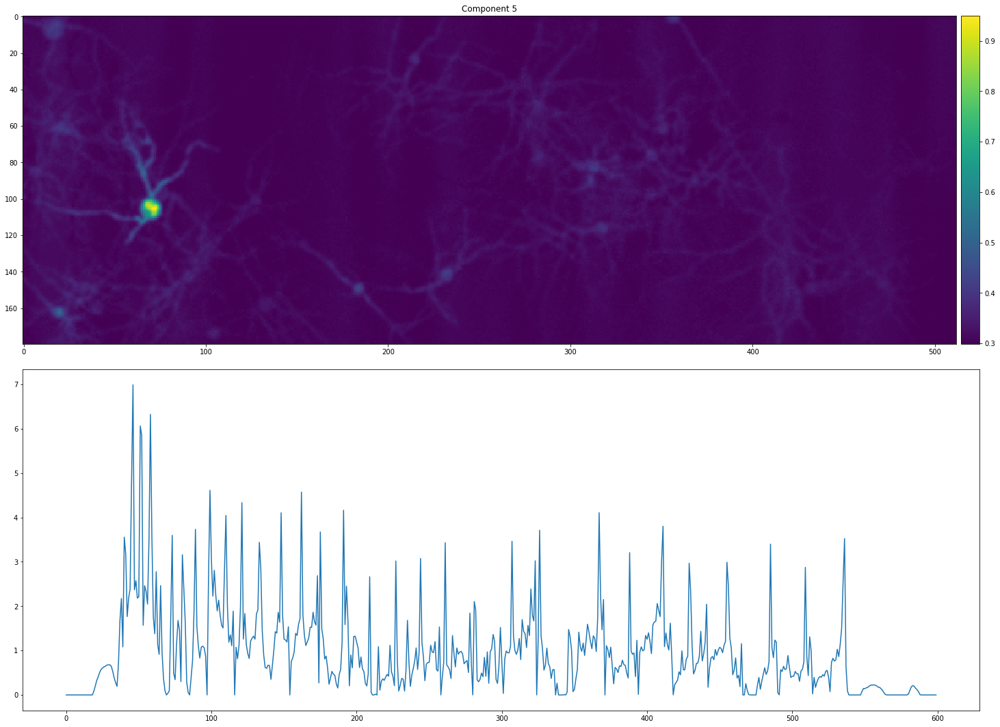

...

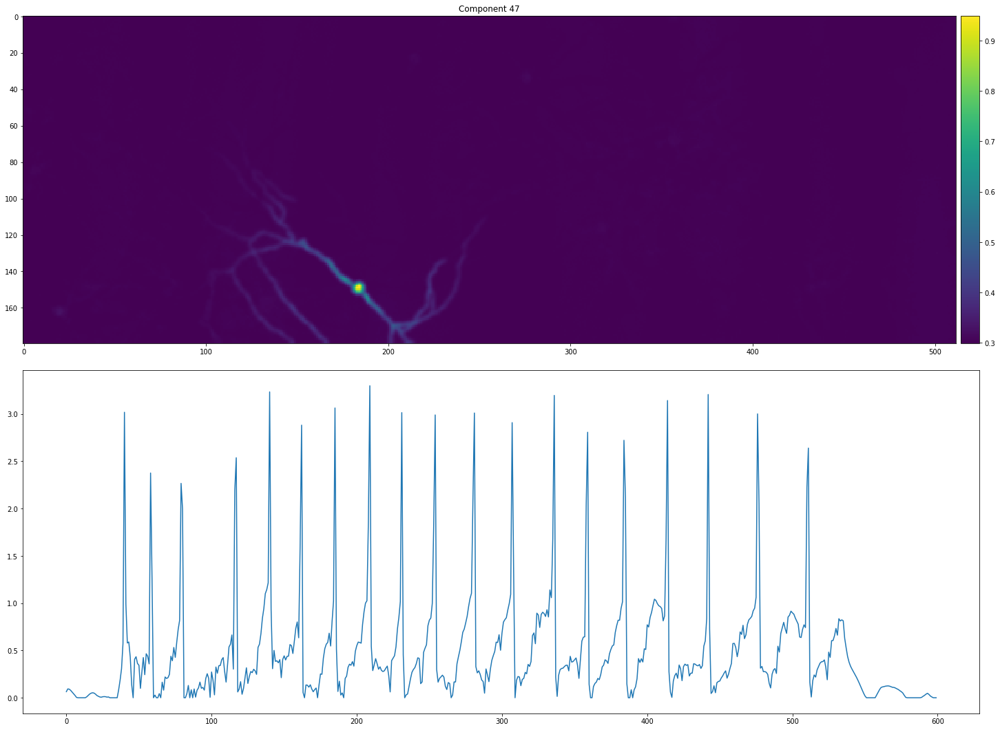

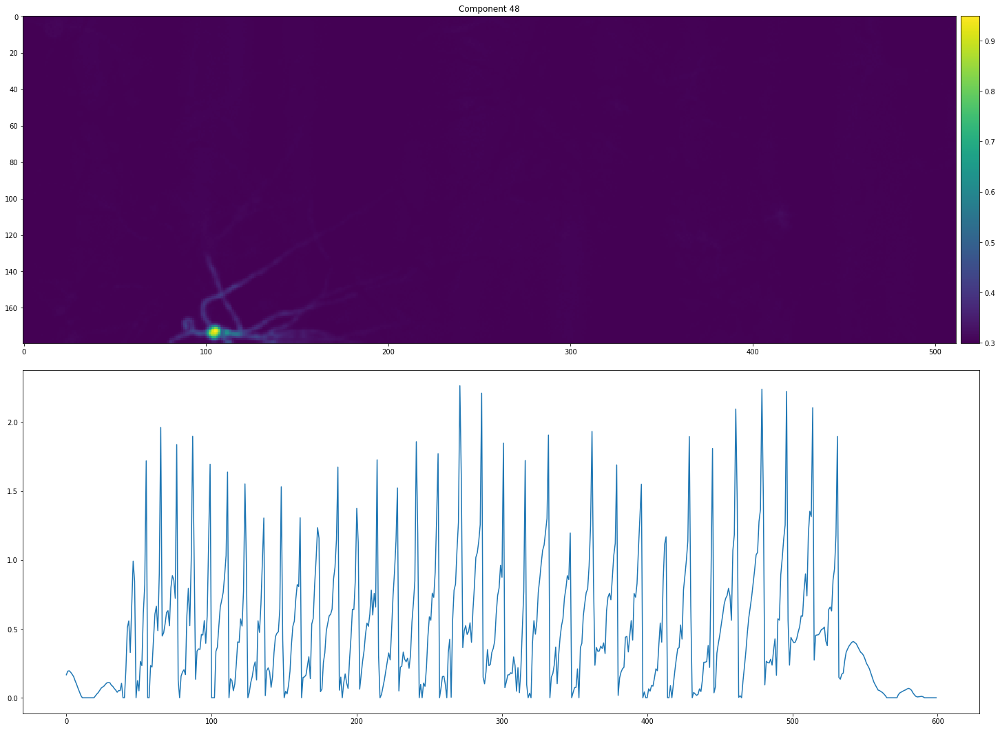

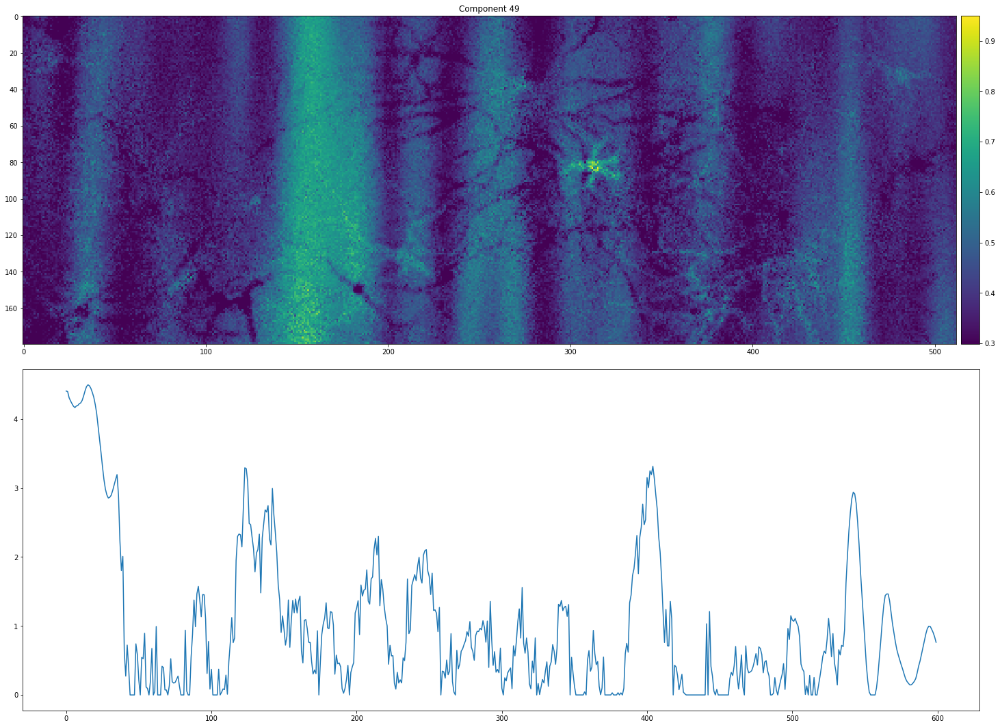

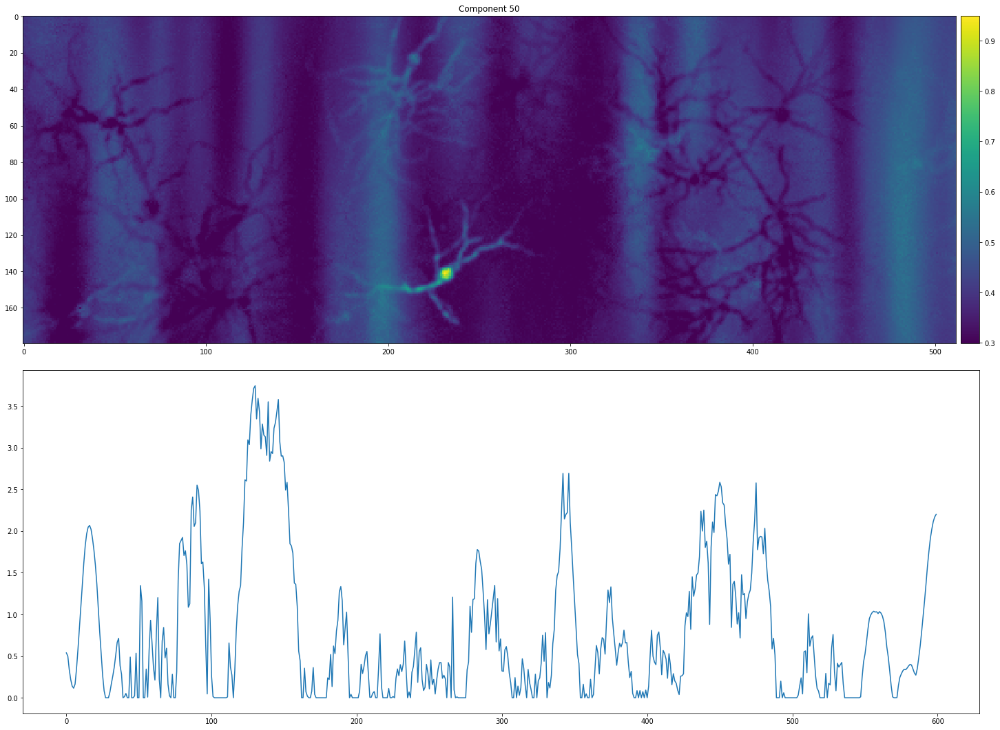

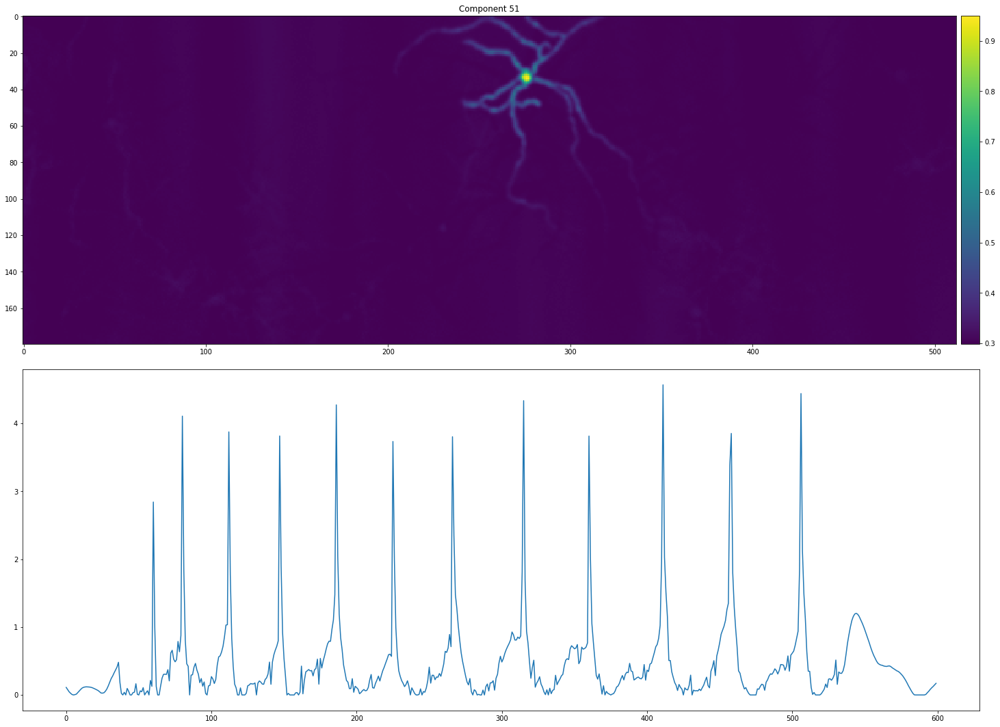

In [126]:
for i in range(H.shape[0]):
    fig, ax = plt.subplots(2, figsize=(20, 15))
    ax[0].set_title(f'Component {i+1}')
    ax[0].imshow(H[i].reshape(180, 512))
    divider = make_axes_locatable(ax[0])
    cax = divider.append_axes("right", size="2%", pad=0.1)
    fig.colorbar(im, cax=cax)
    ax[1].plot(W[:, i])
    fig.tight_layout()
#     plt.savefig(f'{fig_folder}/{i}.png')
#     plt.close()
    plt.show()

In [125]:
from PIL import Image, ImageSequence
# Create the frames
frames = []
imgs = [f'{fig_folder}/{n}.png' for n in range(H.shape[0])]
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)
frames[0].save(f'{fig_folder}/nmf.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=1500, loop=0)

51 132.33603596687317


In [ ]:
target = clean - trend
if re.search('cellmincer', save_folder):
    pred = target.new_tensor(np.load(f'{save_folder}/denoised_movie_frame0to1000_step{num_iters*num_epochs}.npy'))
else:
    pred = target.new_tensor(np.load(f'{save_folder}/denoised_movie_full_step{num_iters*num_epochs}.npy'))
cor_map = get_cor_map(pred-target, topk=4)
fig, ax = plt.subplots(3, figsize=(20, 20))
im = ax[0].imshow((pred-target).mean(0).cpu())
ax[0].set_title('temporal mean of (pred - target)')
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="2%", pad=0.1)
fig.colorbar(im, cax=cax)
im = ax[1].imshow((pred-target).abs().mean(0).cpu())
ax[1].set_title('temporal mean of |pred - target|')
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="2%", pad=0.1)
fig.colorbar(im, cax=cax)
im = ax[2].imshow(cor_map.cpu())
ax[2].set_title('correlation map of (pred - target)')
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="2%", pad=0.1)
fig.colorbar(im, cax=cax)
fig.tight_layout()
plt.savefig(f'{save_folder}/temporal_mean_difference_{num_epochs}epochs.png')
plt.show()

fig, ax = plt.subplots(3, figsize=(16, 16))
ax[0].set_title('spatial mean')
ax[0].plot(pred.mean((1, 2)).cpu(), label='pred')
ax[0].plot(target.mean((1,2)).cpu(), label='target')
ax[0].legend()
ax[1].plot((pred-target).abs().mean((1,2)).cpu(), label='|pred - target|')
ax[1].legend()
ax[2].plot((pred-target).mean((1,2)).cpu(), label='pred - target')
ax[2].legend()
plt.savefig(f'{save_folder}/spatial_mean_difference_{num_epochs}epochs.png')
plt.show()

raw_traces = mat[:, mask_soma].T.cpu().numpy()
pred_traces = pred[:, mask_soma].T.cpu().numpy()
clean_traces = target[:, mask_soma].T.cpu().numpy()
step = np.max(clean_traces.max(1) - clean_traces.min(1))
fig, ax = plt.subplots(figsize=(10, 80))
for i in range(len(raw_traces)):
    ax.plot(raw_traces[i] - i*step, 'b-', markersize=1, alpha=0.3, label='Input' if i==0 else None)
    ax.plot(pred_traces[i] - i*step, 'g-', markersize=1, alpha=0.8, label='Prediction' if i==0 else None)
    ax.plot(clean_traces[i] - i*step, 'r-', markersize=1, alpha=0.5, label='Target'if i==0 else None)
    ax.text(-30, -i*step, f'{i+1}')
ax.set_ylim(-step*len(clean_traces), step)
ax.legend()
ax.set_title('Predicted soma traces')
plt.savefig(f'{save_folder}/denoised_soma_traces_{num_epochs}epochs.png')
plt.show()

In [92]:
command = ['gsutil', 'cp', f'{save_folder}/*.png', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{save_folder}/']
response = subprocess.run(command)
assert response.returncode == 0

In [ ]:
command = ['gsutil', 'ls', 'gs://tma-opp-test/optosynth/optosynth_test_mb/results/']
response = subprocess.run(command, capture_output=True)
assert response.returncode == 0
folders = [f.split('/')[-2] for f in response.stdout.decode().split() if re.search('/$', f) and not re.search('figures|diff_movies', f)]
movie_start_idx = 100
movie_end_idx = 700

In [ ]:
folders = ['2d-noise2self_with_features', '2d-noise2self_with_features_80epochs', '2d-noise2self_with_features_80epochs_2',
           'cellmincer-with_global_features', 'cellmincer-with_global_features_mse']

In [ ]:
for folder in folders:
    if not os.path.exists(folder):
        print(folder)
        os.makedirs(folder)
        command = ['gsutil', 'cp', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{folder}/rmse_losses.pkl', folder]
        response = subprocess.run(command, capture_output=True)
        assert response.returncode == 0
        if not re.search('^cellmincer', folder):
            command = ['gsutil', 'cp', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{folder}/config.json', folder]
            response = subprocess.run(command, capture_output=True)
            assert response.returncode == 0
    if re.search('cellmincer', folder):
#         num_epochs = 80
#         if re.search('epochs', folder):
#             num_epochs = int(folder[-8:-6])
        num_iters = 1000
        command = ['gsutil', 'ls', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{folder}/denoised_movie_frame100to700*npy']
        response = subprocess.run(command, capture_output=True)
        assert response.returncode == 0
        num_epochs = max([int(s.split('step')[-1][:-4]) for s in response.stdout.decode().split()]) // num_iters
    else:
        if not os.path.exists(f'{folder}/config.json'):
            command = ['gsutil', 'cp', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{folder}/config.json', folder]
            response = subprocess.run(command, capture_output=True)
            assert response.returncode == 0
        with open(f'{folder}/config.json', 'r') as f:
            config = json.load(f)
        num_episodes = len([k for k in config.keys() if re.search('^episode', k)])
        num_epochs = sum([config[f'episode{e}']['train_settings']['num_epochs'] for e in range(num_episodes)])
        num_iters = config['episode0']['train_settings']['num_iters']
    print(folder, num_iters, num_epochs)

    target = (clean-trend)[movie_start_idx:movie_end_idx]
    filepath = f'{folder}/denoised_movie_frame{movie_start_idx}to{movie_end_idx}_step{num_iters*num_epochs}.npy'
    if not os.path.exists(filepath):
        print(f'Download {filepath}')
        command = ['gsutil', '-m', 'cp', f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/{filepath}', folder]
        response = subprocess.run(command, capture_output=True)
        assert response.returncode == 0
    pred = target.new_tensor(np.load(filepath))
    def normalize(mat, scale=255):
        return (mat - mat.min()) / (mat.max() - mat.min()) * scale
#     if not os.path.exists(f'diff_movies/{folder}.avi'):
#         print(f'Make video diff_movies/{folder}.avi')
#         make_video_ffmpeg(torch.cat([normalize(pred), normalize(target), normalize(pred-target)], dim=1), 
#                           save_path=f'diff_movies/{folder}.avi')

In [ ]:
colors = get_good_colors()

def get_label(model_name):
    if model_name.startswith('2d-noise2self') and not model_name.endswith('with_features'):
        return '2d-noise2self'
    elif model_name.startswith('3d-noise2self'):
        return '3d-noise2self'
    else:
        return model_name

In [ ]:
fig_folder = 'new-figures'

In [ ]:
# model_names = ['2d-noise2self', '3d-noise2self', 'separate-net', 'cellmincer-with_global_features', 'cellmincer-wo_global_features']
# model_names = ['2d-noise2self_2', '3d-noise2self_crop', 'separate-net']
# model_names += [folder for folder in folders 
#                if (re.search('cellmincer', folder)
#                    or folder in ['2d-noise2self_with_features'])]
# model_names += ['cellmincer-with_global_features', 'cellmincer-wo_global_features']
# model_names = [folder for folder in folders 
#                if (re.search('cellmincer', folder) and not re.search('wo', folder)
#                    or folder in ['2d-noise2self_with_features'])]
# model_names = ['2d-noise2self_with_features', 
#                'cellmincer-with_global_features', 
#                'cellmincer-with_global_features_mse',
#               ]
model_names = ['2d-noise2self_with_features', '2d-noise2self_with_features_80epochs_2', 
               'cellmincer-with_global_features', 'cellmincer-with_global_features_80epochs', 
               'cellmincer-with_global_features_mse',
               'cellmincer-with_global_features_mse_80epochs'
              ]
roi_names = ['RMSE of all pixels', 'RMSE of masked neuronal pixels', 'RMSE of 50 soma pixels', 'RMSE of background pixels']
# colors = ['r', 'g', 'b', 'k', 'c']
losses = [pandas.read_pickle(f'{model_name}/rmse_losses.pkl').values for model_name in model_names]
fig_folder = 'figures'
fig, ax = plt.subplots(len(roi_names), figsize=(20, 20))
for j, roi_name in enumerate(roi_names):
    for i, model_name in enumerate(model_names):
        y = losses[i][range(40) if re.search('2d-noise2self', model_name) else range(80), j]
        x = range(1, len(y)+1)
        ax[j].plot(x, y, 'o--' if re.search('wo', model_name) else 'o-', color=colors[i], label=model_name.split('_80epochs')[0])
        ax[j].set_title(roi_name)
        ax[j].set_xlabel('Epoch')
        ax[j].set_ylabel('RMSE')
        ax[j].legend()
fig.tight_layout()
# plt.savefig(f'{fig_folder}/five_models.png')
# plt.savefig(f'{fig_folder}/cellmincer-w-wo-features.png')
# plt.savefig(f'{fig_folder}/cellmincer-mse-losses.png')
# plt.savefig(f'{fig_folder}/2d-noise2self-with-features.png')
# plt.savefig(f'{fig_folder}/2d-noise2self-with-features_all.png')
# plt.savefig(f'{fig_folder}/all.png')
# plt.savefig(f'{fig_folder}/cellmincer_2d-noise2self.png')
# plt.savefig(f'{fig_folder}/cellmincer_2d-noise2self_2.png')
plt.show()

In [28]:
command = ['gsutil', 'cp', '-r', fig_folder, f'gs://tma-opp-test/optosynth/optosynth_test_mb/results/']
response = subprocess.run(command, capture_output=True)
assert response.returncode == 0

In [ ]:
movie_start_idx = 100
movie_end_idx = 700
pred = mat[movie_start_idx:movie_end_idx]
target = (clean - trend)[movie_start_idx:movie_end_idx]
pretrain_loss = [get_loss(pred, target, mask=None), 
 get_loss(pred, target, mask=mask_cell),
 get_loss(pred, target, mask=mask_soma),
 get_loss(pred, target, mask=~mask_cell)]

roi_names = ['all', 'cell', 'soma', 'background']
colors = ['r', 'g', 'b', 'k', 'c']
fig, ax = plt.subplots(len(roi_names), figsize=(20, 20))
for j, roi_name in enumerate(roi_names):
    for i, model_name in enumerate(model_names):
        ax[j].plot([pretrain_loss[j]]+losses[i, :, j].tolist(), f'{colors[i]}o-', label=model_name)
        ax[j].set_title(roi_name)
        ax[j].legend()
fig.tight_layout()
plt.show()

In [ ]:
# train_interval = [0, mat.shape[0]]
# train_index = range(*train_interval)
# start_time = time.time()
# denoised_mat, model = get_denoised_mat(mat[train_index], model=model, ndim=ndim, out_channels=out_channels, 
#                                        num_epochs=num_epochs, num_iters=num_iters, 
#                                        print_every=print_every, batch_size=batch_size, mask_prob=mask_prob, 
#                                        frame_depth=frame_depth, frame_weight=frame_weight, 
#                                        movie_start_idx=movie_start_idx, movie_end_idx=movie_end_idx, 
#                                        save_folder=save_folder, 
#                                        save_intermediate_results=True, normalize=True, 
#                                        last_out_channels=last_out_channels, 
#                                        loss_reg_fn=loss_reg_fn, loss_history=loss_history, loss_threshold=loss_threshold, 
#                                        optimizer_fn=optimizer_fn, optimizer_fn_args=optimizer_fn_args, lr_scheduler=lr_scheduler,
#                                        batch_size_eval=batch_size_eval, 
#                                        verbose=True, return_model=True, device=device)
# end_time = time.time()

# num_episodes = len([k for k in config.keys() if re.search('^episode', k)])
# config[f'episode{num_episodes}'] = {'train_settings': 
#                                    {'num_epochs': num_epochs, 'num_iters': num_iters, 'batch_size': batch_size, 
#                                     'batch_size_eval': batch_size_eval, 'mask_prob': mask_prob,
#                                     'use_importance_sampling': use_importance_sampling, 'time_spent': end_time-start_time,
#                                     'optimizer_fn_args': optimizer_fn_args, 'train_interval': train_interval
#                                    }}
# if lr_scheduler is not None:
#     config[f'episode{num_episodes}']['train_settings']['lr_scheduler'] = (
#         [lr_scheduler['lr_fn'](epoch, **lr_scheduler['lr_fn_args']) for epoch in range(num_epochs)])
# with open(f'{save_folder}/config.json', 'w') as f:
#     json.dump(config, f, indent=2)

In [ ]:
# if mat[train_index].shape[0] < mat.shape[0]:
#     start_time = time.time()
#     denoised_mat = model_denoise(mat, model, ndim=ndim, frame_depth=frame_depth, normalize=True, batch_size=batch_size_eval)
#     end_time = time.time()
#     np.save(f'{save_folder}/denoised_movie_full_step{len(loss_history)}.npy', denoised_mat.cpu().numpy())
#     print(end_time - start_time)